# This cat does not exist
__Суммарное количество баллов: 10__

__Решение отправлять на `ml.course.practice@gmail.com`__

__Тема письма: `[HSE][ML][HW06] <ФИО>`, где вместо `<ФИО>` указаны фамилия и имя__

Цель этого задания - создать котов, которых не существует. В ходе данного задания вы обучите DCGAN и VAE, которые являются одними из первых генеративных моделей. Для этого задания вам наверняка потребуется GPU с CUDA, поэтому рекомендуется использовать Google Colab.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!unzip "/content/drive/MyDrive/HW 6. This Cat Does Not Exist/cat_136.zip" -d "/content/data"

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: /content/data/cat_136/flickr_cat_000168.jpg  
  inflating: /content/data/cat_136/flickr_cat_000169.jpg  
  inflating: /content/data/cat_136/flickr_cat_000170.jpg  
  inflating: /content/data/cat_136/flickr_cat_000171.jpg  
  inflating: /content/data/cat_136/flickr_cat_000172.jpg  
  inflating: /content/data/cat_136/flickr_cat_000173.jpg  
  inflating: /content/data/cat_136/flickr_cat_000178.jpg  
  inflating: /content/data/cat_136/flickr_cat_000179.jpg  
  inflating: /content/data/cat_136/flickr_cat_000181.jpg  
  inflating: /content/data/cat_136/flickr_cat_000185.jpg  
  inflating: /content/data/cat_136/flickr_cat_000186.jpg  
  inflating: /content/data/cat_136/flickr_cat_000187.jpg  
  inflating: /content/data/cat_136/flickr_cat_000188.jpg  
  inflating: /content/data/cat_136/flickr_cat_000189.jpg  
  inflating: /content/data/cat_136/flickr_cat_000190.jpg  
  inflating: /content/data/cat_136/flickr_cat_0

In [3]:
import torch
from torch import nn
from torch.optim import Adam
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
import os 
import cv2
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import random
import numpy as np

%matplotlib inline

In [4]:
def random_noise(batch_size, channels, side_size):
    return torch.randn(batch_size, channels, side_size, side_size).cuda()

def imagewide_average(x):
    return x.mean(dim=(-1, -2))

In [5]:
def visualise(imgs, rows=2):
    imgs = (imgs.transpose(1, 3) + 1) / 2
    imgs = torch.cat([imgs[i::rows] for i in range(rows)], dim=1)
    cols = len(imgs)
    imgs = (torch.cat(list(imgs), dim=1)).cpu().numpy()[:, :, ::-1]
    plt.figure(figsize=(cols*1.5, rows*1.5))
    plt.imshow(imgs)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

In [6]:
class CatDataset(Dataset):
    def __init__(self, path_to_dataset="/content/data/cat_136", size=64):
        self.photo_names = os.listdir(path_to_dataset)
        self.path_base = path_to_dataset
        self.size = size
    
    def __getitem__(self, index):
        path = self.path_base + "/" + self.photo_names[index]
        img = cv2.imread(path) # 136 x 136
        crop_rate = 8
        x_crop = random.randint(0, crop_rate)
        y_crop = random.randint(0, crop_rate)
        img = img[x_crop:136 - crop_rate + x_crop, y_crop:136 - crop_rate + y_crop]
        img = cv2.resize(img, (self.size, self.size), interpolation=cv2.INTER_CUBIC)
        return 2 * torch.tensor(img).float().transpose(0, 2) / 255. - 1
    
    def __len__(self):
        return len(self.photo_names)

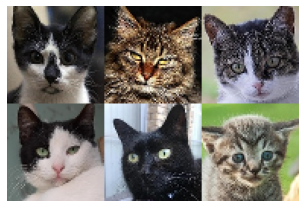

In [7]:
dataset = CatDataset()
visualise(torch.cat([dataset[i].unsqueeze(0) for i in [3, 15, 182, 592, 394, 2941]], dim=0))

### Задание 1 (2 балла)
Для начала реализуем генератор для нашего DCGAN. Предлагается использовать следующую архитектуру:

![](imgs/DCGAN.png)

Для ее реализации вам потребуются модули `nn.BatchNorm2d`, `nn.Conv2d`, `nn.ConvTranspose2D`, `nn.ReLU`, а также функция `F.interpolate`.

#### Методы
* `__init__` - принимает на вход `start_size`, `latent_channels`, `start_channels` и `upsamplings`. Первые два аргумента отвечают за размер случайного шума, из которого в последствии будет сгенерирована картинка. `start_channels` отвечает за то, сколько каналов должно быть в картинке перед тем, как к ней будут применены upsampling блоки. `upsamplings` - это количество upsampling блоков, которые должны быть применены к картинке. В каждом таком локе количество каналов уменьшается в два раза.


* `forward` - принимает на вход `batch_size`, генерирует `batch_size` картинок из случайного шума.

In [8]:
class Generator(nn.Module):

    start_size = None 
    latent_size = None

    def __init__(self, start_size=2, latent_channels=32, start_channels=1024, upsamplings=6):
        super().__init__()

        self.start_size = start_size
        self.latent_size = latent_channels


        self.layer1 = nn.Conv2d(in_channels=latent_channels, out_channels=start_channels, kernel_size=1, stride=1, padding=0)
        out_channels = int(start_channels)
        d = []
        for i in range(0, upsamplings):
            d.append(nn.ConvTranspose2d(in_channels=out_channels, out_channels=int(out_channels / 2), kernel_size=4, stride=2, padding=1))
            out_channels = int(out_channels / 2)
            d.append(nn.BatchNorm2d(out_channels))
            d.append(nn.ReLU())
        
        self.layer2 = nn.Sequential(*d)
        self.layer3 = nn.Conv2d(in_channels=out_channels, out_channels=3, kernel_size=1, stride=1, padding=0)
        self.layer4 = nn.Tanh()
        
    def forward(self, batch_size: int):
      

        tenz = 2 * torch.rand((batch_size, self.latent_size, self.start_size, self.start_size)).to('cuda:0') - 1

        return self.layer4(self.layer3(self.layer2(self.layer1(tenz))))  # torch.Tensor batch_size x 3 x (start_size * 2**upsamplings) x (start_size * 2**upsamplings)

### Задание 2 (2 балла)
Для начала реализуем дискриминатор для нашего DCGAN. Предлагается использовать следующую архитектуру:

![](imgs/Disc_DCGAN.png)

Для ее реализации вам потребуются модули `nn.BatchNorm2d`, `nn.Conv2d`, `nn.ReLU` и `nn.Sigmoid`.

#### Методы
* `__init__` - принимает на вход `start_channels` и `downsamplings`. `start_channels` определяет количество каналов, которые должны быть в изображении перед применением downsampling блоков.


* `forward` - принимает на вход `x` - тензор с картинками. Возвращает вектор с размерностью `batch_size`.

In [9]:
class Discriminator(nn.Module):
    def __init__(self, image_size=128, downsamplings=6, start_channels=8):
        super().__init__()
        self.layer1 = nn.Conv2d(in_channels=3, out_channels=start_channels, kernel_size=1, stride=1, padding=0)
        out_channels = int(start_channels)
        
        d = []
        for i in range(0, downsamplings):
            d.append(nn.Conv2d(in_channels=out_channels, out_channels=int(out_channels * 2), kernel_size=3, stride=2, padding=1))
            out_channels = int(out_channels * 2)
            d.append(nn.BatchNorm2d(out_channels))
            d.append(nn.ReLU())
        
        
        self.layer2 = nn.Sequential(*d)
        self.layer3 = nn.Flatten()
        self.layer4 = nn.Linear(int(image_size * image_size * start_channels / (2 ** downsamplings)), 1)
        self.layer5 = nn.Sigmoid()


    def forward(self, x):
        # print(x.shape)
        x = self.layer1(x)
        # print(x.shape)
        x = self.layer2(x)
        # print(x.shape)
        x = self.layer3(x)
        # print(x.shape)
        x = self.layer4(x)
        # print(x.shape)
        x = self.layer5(x)
        # print(x.shape)
        return x  # torch.Tensor batch_size x 1

In [ ]:
def train_gan():
    generator = Generator()
    discriminator = Discriminator()
    print(generator)
    print(discriminator)
    epochs = 120
    visualise_every = 30
    batch_size = 8
    generator.cuda()
    discriminator.cuda()

    gen_optim = Adam(generator.parameters(), lr=1e-4, betas=(0.5, 0.999))
    disc_optim = Adam(discriminator.parameters(), lr=1e-4, betas=(0.5, 0.999))

    dataset = CatDataset(size=128)

    for ep in range(epochs):
        dataloader = DataLoader(dataset, shuffle=True, batch_size=batch_size)
        total_batches = 0
        gen_loss_avg = 0
        disc_loss_avg = 0

        for i, batch in tqdm(enumerate(dataloader), total=(len(dataset) + batch_size) // batch_size):
            if len(batch) < batch_size:
                continue
            total_batches += 1
            # Positive update
            batch = batch.cuda()
            pred = discriminator(batch)
            loss = F.binary_cross_entropy(pred, torch.ones_like(pred))
            disc_optim.zero_grad()
            loss.backward()
            disc_optim.step()
            disc_loss_avg += loss.item()

            # Negative update
            batch = generator(batch_size).detach()
            pred = discriminator(batch)
            loss = F.binary_cross_entropy(pred, torch.zeros_like(pred))
            disc_optim.zero_grad()
            loss.backward()
            disc_optim.step()
            disc_loss_avg += loss.item()

            # Generator update
            batch = generator(batch_size)
            pred = discriminator(batch)
            loss = F.binary_cross_entropy(pred, torch.ones_like(pred))
            gen_optim.zero_grad()
            loss.backward()
            gen_optim.step()
            gen_loss_avg += loss.item()
            
            if ((ep + 1) % visualise_every == 0) and (i % 5 == 0):
                with torch.no_grad():
                    visualise(generator(1), rows=1)

        print(f"Epoch {ep+1} | Discriminator loss: {disc_loss_avg / total_batches} | Generator loss: {gen_loss_avg / total_batches}")

Generator(
  (layer1): Conv2d(32, 1024, kernel_size=(1, 1), stride=(1, 1))
  (layer2): Sequential(
    (0): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU()
    (12): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (13): BatchNorm2d(32, eps=1e-05, momentum=0

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 1 | Discriminator loss: 0.4058329013721688 | Generator loss: 3.9464568983971704


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 2 | Discriminator loss: 0.7165141299219443 | Generator loss: 2.7771914435654694


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 3 | Discriminator loss: 0.9808062466370485 | Generator loss: 2.0483105363127607


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 4 | Discriminator loss: 1.0032942636858277 | Generator loss: 1.888692325270324


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 5 | Discriminator loss: 1.0513967836264126 | Generator loss: 1.7412319512841123


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 6 | Discriminator loss: 1.0794524807506096 | Generator loss: 1.6665607329851353


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 7 | Discriminator loss: 1.0061193902670227 | Generator loss: 1.746772132119777


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 8 | Discriminator loss: 0.982204341138742 | Generator loss: 1.8070793681263184


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 9 | Discriminator loss: 1.007087570181267 | Generator loss: 1.7189626654852992


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 10 | Discriminator loss: 0.9461297974487917 | Generator loss: 1.8493468902125862


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 11 | Discriminator loss: 0.9442408376124612 | Generator loss: 1.81548333478085


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 12 | Discriminator loss: 0.9023461488468908 | Generator loss: 1.8586430765734696


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 13 | Discriminator loss: 0.871623691316023 | Generator loss: 1.9152954449379667


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 14 | Discriminator loss: 0.8461241096833733 | Generator loss: 2.023979741964281


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 15 | Discriminator loss: 0.7840929121113099 | Generator loss: 2.0827159369769306


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 16 | Discriminator loss: 0.775132474129418 | Generator loss: 2.143223724380043


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 17 | Discriminator loss: 0.7244993163683446 | Generator loss: 2.2000090521499978


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 18 | Discriminator loss: 0.7128874609219373 | Generator loss: 2.374445515574876


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 19 | Discriminator loss: 0.6477707050601889 | Generator loss: 2.4577493643538553


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 20 | Discriminator loss: 0.6373668604679348 | Generator loss: 2.523951009008455


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 21 | Discriminator loss: 0.5841065356360571 | Generator loss: 2.6928362421552587


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 22 | Discriminator loss: 0.5810550169091743 | Generator loss: 2.770439618862934


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 23 | Discriminator loss: 0.5525409351864949 | Generator loss: 2.7738612939297043


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 24 | Discriminator loss: 0.5349365863003638 | Generator loss: 2.9002921470203753


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 25 | Discriminator loss: 0.4911561184537435 | Generator loss: 2.9794374552572735


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 26 | Discriminator loss: 0.47235976762943815 | Generator loss: 3.0790577818703206


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 27 | Discriminator loss: 0.45138869395142245 | Generator loss: 3.308832855976146


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 28 | Discriminator loss: 0.46666114784042156 | Generator loss: 3.1688147262201545


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 29 | Discriminator loss: 0.45268314017683575 | Generator loss: 3.2336466996381


  0%|          | 0/645 [00:00<?, ?it/s]

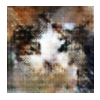

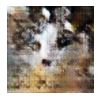

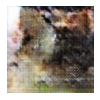

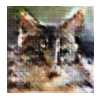

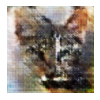

...

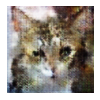

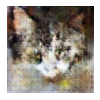

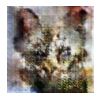

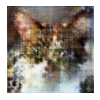

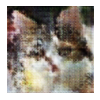

Epoch 30 | Discriminator loss: 0.43853703031126323 | Generator loss: 3.419782837818128


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 31 | Discriminator loss: 0.41295159117301333 | Generator loss: 3.4864958117467277


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 32 | Discriminator loss: 0.38748589376332376 | Generator loss: 3.4846826778805773


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 33 | Discriminator loss: 0.40558165160898246 | Generator loss: 3.5159799511203116


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 34 | Discriminator loss: 0.38079735399807524 | Generator loss: 3.621279485477424


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 35 | Discriminator loss: 0.36434756711903854 | Generator loss: 3.6808993675693964


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 36 | Discriminator loss: 0.3610717944003391 | Generator loss: 3.7971747988684577


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 37 | Discriminator loss: 0.3584408144050042 | Generator loss: 3.7912345371261145


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 38 | Discriminator loss: 0.3567980581042914 | Generator loss: 3.7453380395536837


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 39 | Discriminator loss: 0.3556330954551249 | Generator loss: 3.823419404140911


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 40 | Discriminator loss: 0.3232858435771592 | Generator loss: 3.889652887486523


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 41 | Discriminator loss: 0.33592826488770894 | Generator loss: 3.910882578410717


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 42 | Discriminator loss: 0.33361811466474706 | Generator loss: 3.953120377493201


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 43 | Discriminator loss: 0.34327335098976797 | Generator loss: 3.9523262926232743


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 44 | Discriminator loss: 0.33961661936888243 | Generator loss: 4.084704237880174


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 45 | Discriminator loss: 0.31971693285629854 | Generator loss: 4.081771379024346


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 46 | Discriminator loss: 0.30885762188671784 | Generator loss: 4.03937201690137


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 47 | Discriminator loss: 0.2806195132890019 | Generator loss: 4.267097896855811


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 48 | Discriminator loss: 0.28124938552457407 | Generator loss: 4.3041671272020166


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 49 | Discriminator loss: 0.3128710892775778 | Generator loss: 4.322660799815048


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 50 | Discriminator loss: 0.29031269127128934 | Generator loss: 4.24515002938161


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 51 | Discriminator loss: 0.2848607358295769 | Generator loss: 4.359380225494782


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 52 | Discriminator loss: 0.27680595456773044 | Generator loss: 4.378795364998883


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 53 | Discriminator loss: 0.27865860710725887 | Generator loss: 4.518131286646268


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 54 | Discriminator loss: 0.28151970922151476 | Generator loss: 4.382009502199495


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 55 | Discriminator loss: 0.265120278336278 | Generator loss: 4.408945700026447


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 56 | Discriminator loss: 0.2950239259972895 | Generator loss: 4.585046206942256


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 57 | Discriminator loss: 0.27106209238082496 | Generator loss: 4.531152716982438


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 58 | Discriminator loss: 0.27424336413577455 | Generator loss: 4.599178977819704


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 59 | Discriminator loss: 0.2659807447200314 | Generator loss: 4.45743429364625


  0%|          | 0/645 [00:00<?, ?it/s]

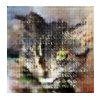

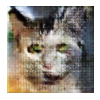

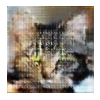

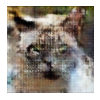

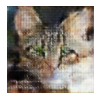

...

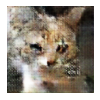

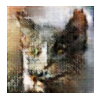

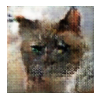

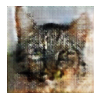

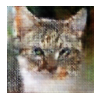

Epoch 60 | Discriminator loss: 0.27098588409955937 | Generator loss: 4.636476453139175


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 61 | Discriminator loss: 0.2665774415472005 | Generator loss: 4.579945393971035


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 62 | Discriminator loss: 0.2685204079707422 | Generator loss: 4.580874418619997


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 63 | Discriminator loss: 0.2493953691978983 | Generator loss: 4.533527302445832


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 64 | Discriminator loss: 0.23662844378782563 | Generator loss: 4.847012430568289


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 65 | Discriminator loss: 0.24450609879304408 | Generator loss: 4.598059010894402


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 66 | Discriminator loss: 0.2353138377774999 | Generator loss: 4.739350100759394


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 67 | Discriminator loss: 0.23312548777578893 | Generator loss: 4.863100280950529


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 68 | Discriminator loss: 0.24048674589541777 | Generator loss: 4.970570366760218


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 69 | Discriminator loss: 0.21952535781980628 | Generator loss: 4.777985719697816


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 70 | Discriminator loss: 0.24284548967094868 | Generator loss: 4.810269797625749


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 71 | Discriminator loss: 0.24015063324231564 | Generator loss: 4.779670892850213


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 72 | Discriminator loss: 0.20773886382629464 | Generator loss: 4.899185308295747


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 73 | Discriminator loss: 0.20874932379671648 | Generator loss: 4.9357816657479505


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 74 | Discriminator loss: 0.24730683345424945 | Generator loss: 4.96698420536444


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 75 | Discriminator loss: 0.21989834500807984 | Generator loss: 4.940851313449581


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 76 | Discriminator loss: 0.2131802959013879 | Generator loss: 4.829603153911436


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 77 | Discriminator loss: 0.21026344601016164 | Generator loss: 5.109036484953039


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 78 | Discriminator loss: 0.22353930105996947 | Generator loss: 5.127116066698703


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 79 | Discriminator loss: 0.20911703492878791 | Generator loss: 4.940508971118039


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 80 | Discriminator loss: 0.19484768684890488 | Generator loss: 5.102142050214436


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 81 | Discriminator loss: 0.20841115162629056 | Generator loss: 4.893539190940235


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 82 | Discriminator loss: 0.19955802758587132 | Generator loss: 5.039587583092058


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 83 | Discriminator loss: 0.20126199217405805 | Generator loss: 5.2351906493954035


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 84 | Discriminator loss: 0.18069892106833782 | Generator loss: 5.140136299481303


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 85 | Discriminator loss: 0.21588047466790364 | Generator loss: 5.239527543139014


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 86 | Discriminator loss: 0.18210081586795504 | Generator loss: 5.1306332712588105


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 87 | Discriminator loss: 0.20925930699683523 | Generator loss: 5.358135175630913


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 88 | Discriminator loss: 0.1953994837766513 | Generator loss: 5.3306545574472555


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 89 | Discriminator loss: 0.18881891292466368 | Generator loss: 5.132789743520458


  0%|          | 0/645 [00:00<?, ?it/s]

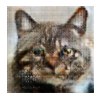

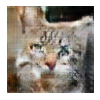

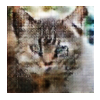

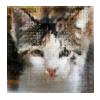

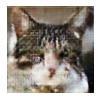

...

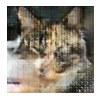

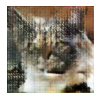

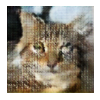

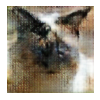

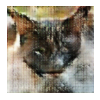

Epoch 90 | Discriminator loss: 0.19569277222404582 | Generator loss: 5.088982422714648


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 91 | Discriminator loss: 0.17086157356171147 | Generator loss: 5.354409676716195


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 92 | Discriminator loss: 0.19768606183401363 | Generator loss: 5.2858008436904935


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 93 | Discriminator loss: 0.19250910525878318 | Generator loss: 5.291216486775727


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 94 | Discriminator loss: 0.21080649217484418 | Generator loss: 5.195505653479085


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 95 | Discriminator loss: 0.19704187812652027 | Generator loss: 5.151822476838687


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 96 | Discriminator loss: 0.20088774019272215 | Generator loss: 5.158564546278545


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 97 | Discriminator loss: 0.16416850623777013 | Generator loss: 5.398693282967028


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 98 | Discriminator loss: 0.17476825369189636 | Generator loss: 5.44908206923778


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 99 | Discriminator loss: 0.17108261642608974 | Generator loss: 5.577519569245184


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 100 | Discriminator loss: 0.1712521877841864 | Generator loss: 5.657153405573057


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 101 | Discriminator loss: 0.19307527965462232 | Generator loss: 5.338990508954717


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 102 | Discriminator loss: 0.15927540148264027 | Generator loss: 5.343344008052571


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 103 | Discriminator loss: 0.1758513461307386 | Generator loss: 5.453592093464751


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 104 | Discriminator loss: 0.16889124325942945 | Generator loss: 5.605841554192282


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 105 | Discriminator loss: 0.1753402453586051 | Generator loss: 5.544544900518767


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 106 | Discriminator loss: 0.16241740090228649 | Generator loss: 5.6117294317817095


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 107 | Discriminator loss: 0.1530796939325722 | Generator loss: 5.615074121618863


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 108 | Discriminator loss: 0.1914823116523903 | Generator loss: 5.619686491185834


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 109 | Discriminator loss: 0.16890148844798894 | Generator loss: 5.618162228268866


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 110 | Discriminator loss: 0.16375421297590592 | Generator loss: 5.553378244179376


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 111 | Discriminator loss: 0.14936696122459833 | Generator loss: 5.709201707788136


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 112 | Discriminator loss: 0.16122743921024668 | Generator loss: 5.681970102261312


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 113 | Discriminator loss: 0.1542193101477124 | Generator loss: 5.747688017276503


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 114 | Discriminator loss: 0.1750489348427315 | Generator loss: 5.635085114225838


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 115 | Discriminator loss: 0.1403309295459187 | Generator loss: 5.626087420660516


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 116 | Discriminator loss: 0.1655174738528101 | Generator loss: 5.829258843330863


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 117 | Discriminator loss: 0.13328959041831204 | Generator loss: 5.842291703690654


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 118 | Discriminator loss: 0.14067453828674695 | Generator loss: 6.036724077063318


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 119 | Discriminator loss: 0.1490059008282589 | Generator loss: 6.100527064770645


  0%|          | 0/645 [00:00<?, ?it/s]

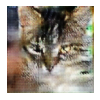

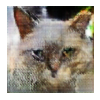

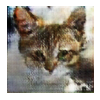

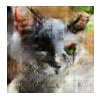

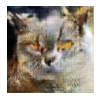

...

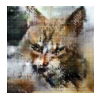

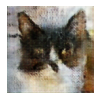

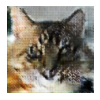

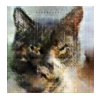

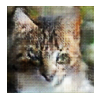

Epoch 120 | Discriminator loss: 0.13676077862291128 | Generator loss: 5.97288568826936


In [ ]:
train_gan()

### Задание 3 (5 баллов)
Теперь посмотрим на другую модель: Variational Autoencoder. В отличии от GAN, в котором генератор пытается себя обмануть дискриминатор, а дискриминатор старается не быть обманутым, VAE решает задачу реконструкции элемента множества X с применением регуляризации в латентном пространстве. 

Полностью архитектура выглядит так:
![](imgs/VAE.png)

Из нее можно выделить две части: Encoder (по изображению возвращает mu и sigma) и Decoder (по случайному шуму восстанавливает изображение). На высоком уровне VAE можно представить так:

![](imgs/VAE_highlevel.png)

В данном задании вам необходимо реализовать полную архитектуру VAE.

#### Методы
* `__init__` - принимает на вход `img_size`, `downsamplings`, `latent_size`, `linear_hidden_size`, `down_channels` и `up_channels`. `img_size` - размер стороны входного изображения. `downsamplings` - количество downsampling (и upsampling) блоков. `latent_size` - размер латентного пространства, в котором в который будет закодирована картинка. `linear_hidden_size` количество нейронов на скрытом слое полносвязной сети в конце encoder'а. Для полносвязной сети decoder'а это число стоит умножить на 2. `down_channels` - количество каналов, в которое будет преобразовано трехцветное изображение перед применением `downsampling` блоков. `up_channels` - количество каналов, которое должно получиться после применения всех upsampling блоков.

* `forward` - принимает на вход `x`. Считает распределение $N(\mu, \sigma^2)$ и вектор $z \sim N(\mu, \sigma^2)$. Возвращает $x'$ - восстановленную из вектора $z$ картинку и $D_{KL}(N(\mu, \sigma^2), N(0, 1)) = 0.5 \cdot (\sigma^2 + \mu^2 - \log \sigma^2 - 1)$.

* `encode` - принимает на вход `x`. Возвращает вектор из распределения $N(\mu, \sigma^2)$.

* `decode` - принимает на вход `z`. Возвращает восстановленную по вектору картинку.


#### Если хочется улучшить качество
https://arxiv.org/pdf/1906.00446.pdf

In [10]:
class VAE(nn.Module):
    def __init__(self, downsamplings=7, latent_size=512, down_channels=8, up_channels=16):
        super().__init__()

        d = []
        out_channels = int(up_channels * (2 ** downsamplings))
        d.append(nn.Conv2d(in_channels=latent_size, out_channels=out_channels, kernel_size=1, stride=1, padding=0))
        for i in range(0, downsamplings):
            d.append(nn.ConvTranspose2d(in_channels=out_channels, out_channels=int(out_channels / 2), kernel_size=4, stride=2, padding=1))
            out_channels = int(out_channels / 2)
            d.append(nn.BatchNorm2d(out_channels))
            d.append(nn.ReLU())
        d.append(nn.Conv2d(in_channels=out_channels, out_channels=3, kernel_size=1, stride=1, padding=0))
        d.append(nn.Tanh())
        self.decoder = nn.Sequential(*d)
        

        
        d = []
        d.append(nn.Conv2d(in_channels=3, out_channels=down_channels, kernel_size=1, stride=1, padding=0))
        out_channels = int(down_channels)
        for i in range(0, downsamplings):
            d.append(nn.Conv2d(in_channels=out_channels, out_channels=int(out_channels * 2), kernel_size=3, stride=2, padding=1))
            out_channels = int(out_channels * 2)
            d.append(nn.BatchNorm2d(out_channels))
            d.append(nn.ReLU())
        d.append(nn.Conv2d(in_channels=out_channels, out_channels=latent_size * 2, kernel_size=1, stride=1, padding=0))
        self.encoder =  nn.Sequential(*d)
        # print(self.encoder)
        # print(self.decoder)ё
        self.mu = None
        self.sigma = None

    def forward(self, x):
        z = self.encode(x)
        
        kld = (self.sigma ** 2 + self.mu ** 2 - torch.log(self.sigma ** 2) - 1) / 2

        return self.decode(z), kld
    
    def encode(self, x):
        y = torch.squeeze(self.encoder(x))
        n = int(len(y.T) / 2)
        self.sigma = (torch.exp(y.T[n:].T)).std(axis=1)
        self.mu = (y.T[:n].T).mean(axis=1)
        z = []
        for i, val in enumerate(self.sigma):
            z.append(torch.empty(n).normal_(mean=float(self.mu[i]), std=float(self.sigma[i])).to('cuda:0'))  
        z = torch.stack(z,dim=0)
        return z
    
    def decode(self, z):
        return self.decoder(torch.unsqueeze(torch.unsqueeze(z, 2), 3))

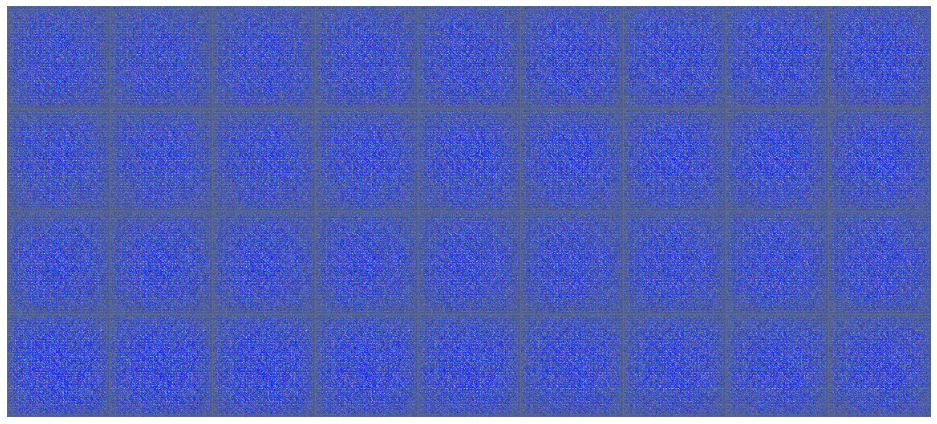

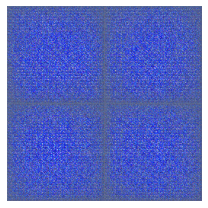

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 1 | Reconstruction loss: 13657.95694329872 | KLD loss: 0.009820549222438232


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 2 | Reconstruction loss: 12626.187975391838 | KLD loss: 0.0035011492530751674


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 3 | Reconstruction loss: 12545.848810231464 | KLD loss: 0.0030264930093880766


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 4 | Reconstruction loss: 12500.275706036491 | KLD loss: 0.0031239656696778646


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 5 | Reconstruction loss: 12472.388826547942 | KLD loss: 0.0031135917311499576


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 6 | Reconstruction loss: 12448.852736194682 | KLD loss: 0.0027822624683750343


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 7 | Reconstruction loss: 12461.17182116775 | KLD loss: 0.002746044617632161


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 8 | Reconstruction loss: 12438.940232555318 | KLD loss: 0.002440324608491074


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 9 | Reconstruction loss: 12437.526739464043 | KLD loss: 0.0023511783885104315


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 10 | Reconstruction loss: 12445.394594938858 | KLD loss: 0.0021623006634275367


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 11 | Reconstruction loss: 12431.062770677649 | KLD loss: 0.0018336837474974045


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 12 | Reconstruction loss: 12436.97584524214 | KLD loss: 0.0016847568454209322


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 13 | Reconstruction loss: 12438.292554772419 | KLD loss: 0.0015493285327409364


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 14 | Reconstruction loss: 12443.0617402829 | KLD loss: 0.0014392489116199269


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 15 | Reconstruction loss: 12424.183023583075 | KLD loss: 0.0012518073900701096


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 16 | Reconstruction loss: 12438.426370371943 | KLD loss: 0.0012831071634655414


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 17 | Reconstruction loss: 12429.166098268875 | KLD loss: 0.0010147249522786702


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 18 | Reconstruction loss: 12424.259867223893 | KLD loss: 0.0010912664674268746


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 19 | Reconstruction loss: 12431.95971073127 | KLD loss: 0.000947124492492735


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 20 | Reconstruction loss: 12422.896143942886 | KLD loss: 0.0008906615747613196


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 21 | Reconstruction loss: 12422.05627062306 | KLD loss: 0.0008441865999506127


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 22 | Reconstruction loss: 12427.600745159647 | KLD loss: 0.0007067761436012221


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 23 | Reconstruction loss: 12419.154170255484 | KLD loss: 0.0007692409436339917


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 24 | Reconstruction loss: 12436.442329738451 | KLD loss: 0.0006590085971799696


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 25 | Reconstruction loss: 12422.764249623933 | KLD loss: 0.0006489825105259878


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 26 | Reconstruction loss: 12418.299155667703 | KLD loss: 0.0006075315061748398


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 27 | Reconstruction loss: 12427.943016668285 | KLD loss: 0.0005973168758687025


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 28 | Reconstruction loss: 12417.30237650427 | KLD loss: 0.0005644509187026054


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 29 | Reconstruction loss: 12428.50030328028 | KLD loss: 0.0005051542582534114


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 30 | Reconstruction loss: 12429.097155079338 | KLD loss: 0.00046177033728324107


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 31 | Reconstruction loss: 12434.410832565023 | KLD loss: 0.00044259214947312513


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 32 | Reconstruction loss: 12424.424959360442 | KLD loss: 0.00042784507878078435


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 33 | Reconstruction loss: 12431.176003402805 | KLD loss: 0.00042058349303577256


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 34 | Reconstruction loss: 12422.701310625727 | KLD loss: 0.0003548068058046495


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 35 | Reconstruction loss: 12429.119503803135 | KLD loss: 0.00038415295366915115


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 36 | Reconstruction loss: 12423.355252662801 | KLD loss: 0.0003765871435959147


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 37 | Reconstruction loss: 12419.625191066576 | KLD loss: 0.0003143370220935123


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 38 | Reconstruction loss: 12424.890161739373 | KLD loss: 0.0003146411885756143


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 39 | Reconstruction loss: 12422.204756647903 | KLD loss: 0.0002776257786321344


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 40 | Reconstruction loss: 12418.914590207687 | KLD loss: 0.0002844552307025246


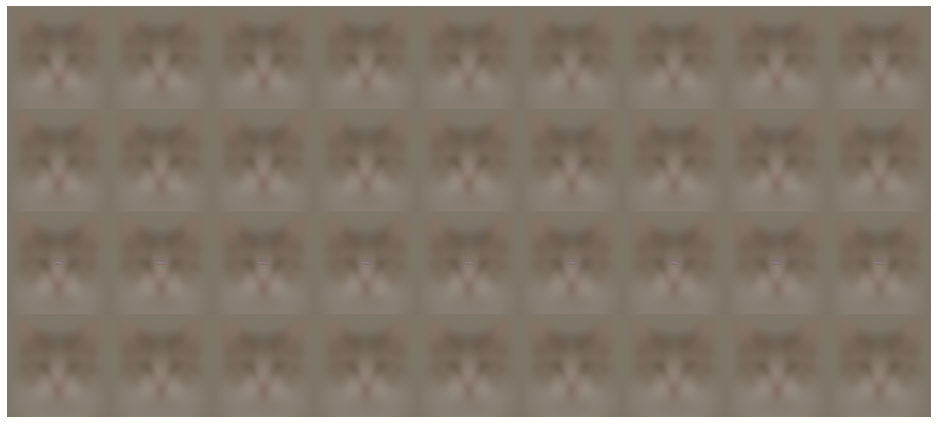

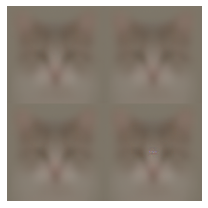

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 41 | Reconstruction loss: 12429.71182611122 | KLD loss: 0.0003038614479281147


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 42 | Reconstruction loss: 12425.753296656638 | KLD loss: 0.0002910725031950459


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 43 | Reconstruction loss: 12424.988914347583 | KLD loss: 0.0002607424506304427


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 44 | Reconstruction loss: 12423.444080423864 | KLD loss: 0.00023597364331254307


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 45 | Reconstruction loss: 12422.974668514655 | KLD loss: 0.00022956187495533725


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 46 | Reconstruction loss: 12427.318416998252 | KLD loss: 0.0002522330661738141


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 47 | Reconstruction loss: 12422.074731293673 | KLD loss: 0.00022022717672845593


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 48 | Reconstruction loss: 12425.47777789572 | KLD loss: 0.00022171379894203282


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 49 | Reconstruction loss: 12415.611072611364 | KLD loss: 0.0002054027657701362


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 50 | Reconstruction loss: 12416.67352560292 | KLD loss: 0.00021893246481137247


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 51 | Reconstruction loss: 12428.959443844624 | KLD loss: 0.00021658966213649846


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 52 | Reconstruction loss: 12422.711923160909 | KLD loss: 0.0001951198191931529


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 53 | Reconstruction loss: 12416.055651931289 | KLD loss: 0.00019375572663656674


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 54 | Reconstruction loss: 12422.807338927843 | KLD loss: 0.00016258844400044554


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 55 | Reconstruction loss: 12419.963392553862 | KLD loss: 0.00017411989501174192


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 56 | Reconstruction loss: 12422.901275445216 | KLD loss: 0.00017239481951138988


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 57 | Reconstruction loss: 12421.153767650912 | KLD loss: 0.00014959230602527997


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 58 | Reconstruction loss: 12426.985718531638 | KLD loss: 0.00013413252482503098


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 59 | Reconstruction loss: 12420.52371955066 | KLD loss: 0.00016539373799510625


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 60 | Reconstruction loss: 12417.084200462199 | KLD loss: 0.0001486081468022388


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 61 | Reconstruction loss: 12424.23900836447 | KLD loss: 0.00012995783956894964


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 62 | Reconstruction loss: 12427.286581667313 | KLD loss: 0.00013059110421201458


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 63 | Reconstruction loss: 12421.150003942643 | KLD loss: 0.00011465533040695309


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 64 | Reconstruction loss: 12422.618381666101 | KLD loss: 0.00013227463462708159


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 65 | Reconstruction loss: 12424.386987153048 | KLD loss: 0.0001034036926601244


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 66 | Reconstruction loss: 12425.154446998738 | KLD loss: 0.00013092219227959652


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 67 | Reconstruction loss: 12422.478301812404 | KLD loss: 0.0001035569270390161


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 68 | Reconstruction loss: 12417.944230547602 | KLD loss: 0.00011146873791025292


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 69 | Reconstruction loss: 12418.472112620098 | KLD loss: 0.00010617817780986336


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 70 | Reconstruction loss: 12430.365201014169 | KLD loss: 0.00010917991723703301


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 71 | Reconstruction loss: 12420.288527968507 | KLD loss: 0.00010098792288614356


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 72 | Reconstruction loss: 12414.712734435656 | KLD loss: 8.613220560624733e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 73 | Reconstruction loss: 12416.297028914742 | KLD loss: 0.00010673882243055735


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 74 | Reconstruction loss: 12414.187709263393 | KLD loss: 9.709183612595434e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 75 | Reconstruction loss: 12419.383893694196 | KLD loss: 8.842564240005445e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 76 | Reconstruction loss: 12417.238990925855 | KLD loss: 8.65335072974981e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 77 | Reconstruction loss: 12415.240890976806 | KLD loss: 5.906858475682158e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 78 | Reconstruction loss: 12420.249005240683 | KLD loss: 8.160434663295746e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 79 | Reconstruction loss: 12421.535354898582 | KLD loss: 7.720470937512676e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 80 | Reconstruction loss: 12421.243571974475 | KLD loss: 7.39441779644593e-05


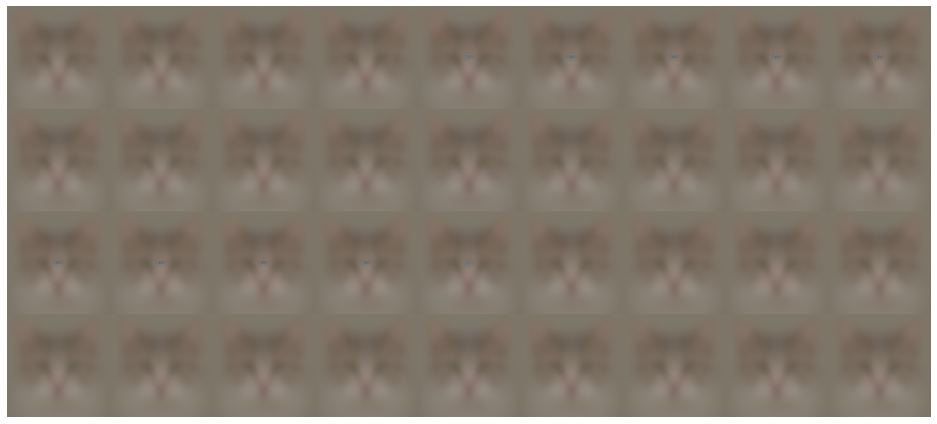

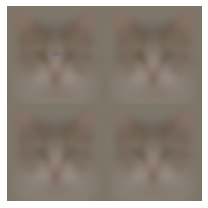

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 81 | Reconstruction loss: 12418.96472395429 | KLD loss: 7.377260636468852e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 82 | Reconstruction loss: 12421.904832164693 | KLD loss: 6.851939172107981e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 83 | Reconstruction loss: 12413.549659871167 | KLD loss: 8.273888263643159e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 84 | Reconstruction loss: 12421.596195197253 | KLD loss: 7.480931300554216e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 85 | Reconstruction loss: 12424.196866811433 | KLD loss: 6.218188621612809e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 86 | Reconstruction loss: 12416.692680785374 | KLD loss: 6.810342025312578e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 87 | Reconstruction loss: 12420.391795661879 | KLD loss: 6.250351065804499e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 88 | Reconstruction loss: 12418.961597134608 | KLD loss: 7.288684339626975e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 89 | Reconstruction loss: 12426.225529830648 | KLD loss: 5.459101720256095e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 90 | Reconstruction loss: 12424.091756690363 | KLD loss: 6.558763453308839e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 91 | Reconstruction loss: 12416.122551011744 | KLD loss: 4.850128977935507e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 92 | Reconstruction loss: 12417.312643299932 | KLD loss: 5.8686314439921644e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 93 | Reconstruction loss: 12416.876871239325 | KLD loss: 6.373014925799755e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 94 | Reconstruction loss: 12425.013169946138 | KLD loss: 5.676667929065894e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 95 | Reconstruction loss: 12427.679842931144 | KLD loss: 5.271607396765525e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 96 | Reconstruction loss: 12420.851727787753 | KLD loss: 5.004431196251271e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 97 | Reconstruction loss: 12425.367769039936 | KLD loss: 5.024109290253301e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 98 | Reconstruction loss: 12421.800177722243 | KLD loss: 4.8779610613858475e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 99 | Reconstruction loss: 12416.851189465257 | KLD loss: 4.3847522935511905e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 100 | Reconstruction loss: 12412.56524620293 | KLD loss: 4.1172348009133194e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 101 | Reconstruction loss: 12426.75243988985 | KLD loss: 4.8192194807603495e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 102 | Reconstruction loss: 12429.497943001505 | KLD loss: 4.79608913015875e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 103 | Reconstruction loss: 12426.623028678183 | KLD loss: 4.562351459301777e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 104 | Reconstruction loss: 12412.589855881211 | KLD loss: 4.7929989902869515e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 105 | Reconstruction loss: 12419.390925247477 | KLD loss: 4.7681911021285916e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 106 | Reconstruction loss: 12421.024770416829 | KLD loss: 4.927608074608797e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 107 | Reconstruction loss: 12413.034344975253 | KLD loss: 4.705745055808784e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 108 | Reconstruction loss: 12415.944730960064 | KLD loss: 4.0772342071029714e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 109 | Reconstruction loss: 12412.082478588412 | KLD loss: 4.01510168676791e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 110 | Reconstruction loss: 12422.64530158191 | KLD loss: 4.1218567061128086e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 111 | Reconstruction loss: 12421.255238408628 | KLD loss: 3.649802265330131e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 112 | Reconstruction loss: 12418.622900542265 | KLD loss: 4.569142594100526e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 113 | Reconstruction loss: 12412.950409125096 | KLD loss: 3.353296923711433e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 114 | Reconstruction loss: 12411.939445542994 | KLD loss: 3.366454602768702e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 115 | Reconstruction loss: 12427.547636991701 | KLD loss: 3.3156911593786675e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 116 | Reconstruction loss: 12428.069079665664 | KLD loss: 3.269893227156645e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 117 | Reconstruction loss: 12424.201005829047 | KLD loss: 2.8960129118854213e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 118 | Reconstruction loss: 12416.785338976368 | KLD loss: 3.865686308893358e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 119 | Reconstruction loss: 12420.571781892953 | KLD loss: 2.8094889954750582e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 120 | Reconstruction loss: 12426.522799853212 | KLD loss: 3.283425749088666e-05


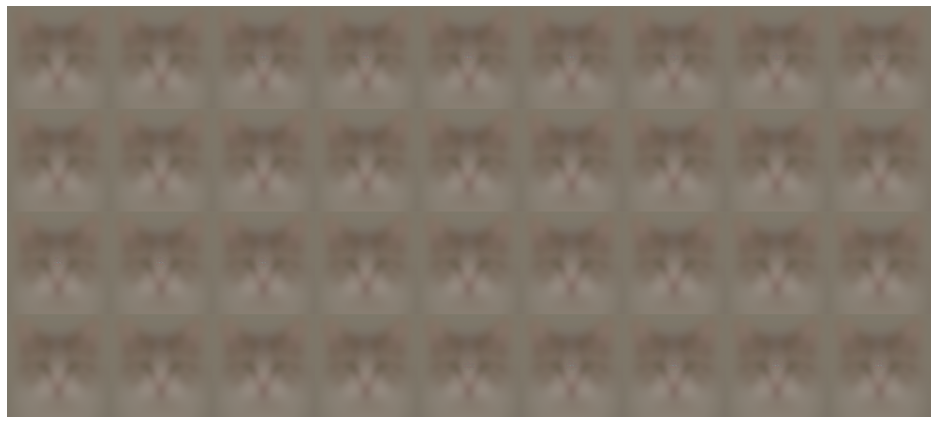

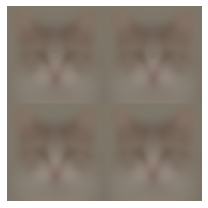

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 121 | Reconstruction loss: 12421.7860243898 | KLD loss: 4.4730972059024785e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 122 | Reconstruction loss: 12423.459404418187 | KLD loss: 3.1733480484589286e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 123 | Reconstruction loss: 12424.66461598651 | KLD loss: 2.394836419117377e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 124 | Reconstruction loss: 12420.267324885966 | KLD loss: 4.3305828704597043e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 125 | Reconstruction loss: 12415.339871045226 | KLD loss: 3.023398172411119e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 126 | Reconstruction loss: 12415.68035926582 | KLD loss: 2.27597536322493e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 127 | Reconstruction loss: 12415.702990798476 | KLD loss: 3.135031933740059e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 128 | Reconstruction loss: 12423.320796232047 | KLD loss: 2.464263335518215e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 129 | Reconstruction loss: 12424.33766316479 | KLD loss: 3.230083525551032e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 130 | Reconstruction loss: 12429.190908112141 | KLD loss: 2.258523188022353e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 131 | Reconstruction loss: 12419.30847547069 | KLD loss: 3.6099185206875296e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 132 | Reconstruction loss: 12416.49531280328 | KLD loss: 3.157505152388389e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 133 | Reconstruction loss: 12423.450005762325 | KLD loss: 2.1060766733211018e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 134 | Reconstruction loss: 12420.267288492332 | KLD loss: 1.8681116078210913e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 135 | Reconstruction loss: 12421.372364494371 | KLD loss: 2.4911814502307345e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 136 | Reconstruction loss: 12423.047790906445 | KLD loss: 2.0974205795282162e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 137 | Reconstruction loss: 12417.277776682598 | KLD loss: 2.966597907661651e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 138 | Reconstruction loss: 12430.1532111316 | KLD loss: 1.6213724424379952e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 139 | Reconstruction loss: 12422.283192510191 | KLD loss: 2.638524779992074e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 140 | Reconstruction loss: 12410.921414013976 | KLD loss: 2.244718789313891e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 141 | Reconstruction loss: 12415.01857591712 | KLD loss: 3.147137970287607e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 142 | Reconstruction loss: 12423.470938167216 | KLD loss: 2.2049137153980896e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 143 | Reconstruction loss: 12416.73846625097 | KLD loss: 2.3393527321193528e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 144 | Reconstruction loss: 12426.953487419934 | KLD loss: 1.5890827367764824e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 145 | Reconstruction loss: 12418.62255859375 | KLD loss: 2.115710366586721e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 146 | Reconstruction loss: 12418.32863451087 | KLD loss: 3.0326616504917975e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 147 | Reconstruction loss: 12425.070419406298 | KLD loss: 2.367107301765347e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 148 | Reconstruction loss: 12422.666032305415 | KLD loss: 3.242389709682938e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 149 | Reconstruction loss: 12415.61507060365 | KLD loss: 2.1459662025759678e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 150 | Reconstruction loss: 12420.892250582297 | KLD loss: 1.5341104095026572e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 151 | Reconstruction loss: 12416.27383782997 | KLD loss: 2.238172922075165e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 152 | Reconstruction loss: 12410.269050550756 | KLD loss: 2.281970535376057e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 153 | Reconstruction loss: 12423.514359563034 | KLD loss: 2.106980229756847e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 154 | Reconstruction loss: 12415.58194481512 | KLD loss: 1.418214545857092e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 155 | Reconstruction loss: 12418.359057313908 | KLD loss: 2.1967967474682732e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 156 | Reconstruction loss: 12415.13902064732 | KLD loss: 2.3464088021598248e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 157 | Reconstruction loss: 12411.890498380484 | KLD loss: 2.2249458276707195e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 158 | Reconstruction loss: 12415.448851780862 | KLD loss: 2.1966000706512735e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 159 | Reconstruction loss: 12421.218983525816 | KLD loss: 1.4860634200321221e-05


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 160 | Reconstruction loss: 12414.784595181483 | KLD loss: 1.9325602869069355e-05


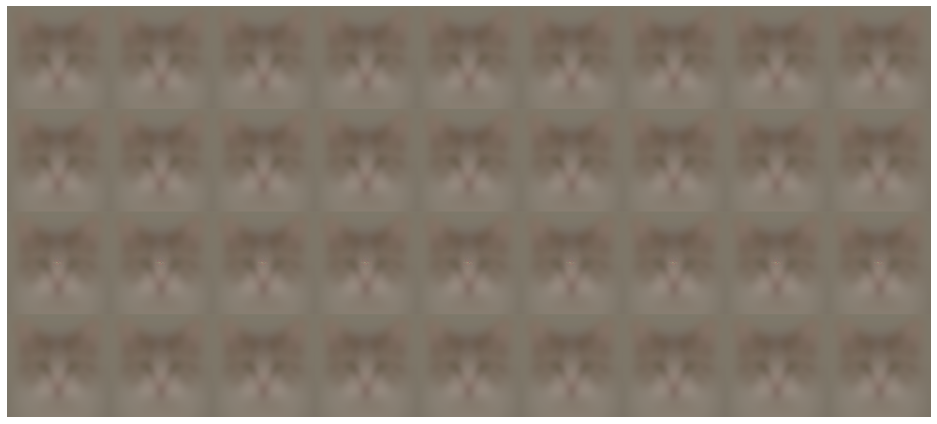

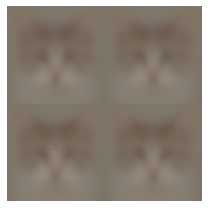

  0%|          | 0/645 [00:00<?, ?it/s]

In [ ]:
def train_vae():
    vae = VAE()
    vae.cuda()

    epochs = 201
    batch_size = 8
    vae_optim = Adam(vae.parameters(), lr=1e-4)

    dataset = CatDataset(size=128)

    test_imgs_1 = torch.cat([dataset[i].unsqueeze(0) for i in (0, 34, 76, 1509)])
    test_imgs_2 = torch.cat([dataset[i].unsqueeze(0) for i in (734, 123, 512, 3634)])

    for ep in range(epochs):
        dataloader = DataLoader(dataset, shuffle=True, batch_size=batch_size)
        total_batches = 0
        rec_loss_avg = 0
        kld_loss_avg = 0

        if ep % 40 == 0:
            with torch.no_grad():
                z_1 = vae.encode(test_imgs_1.cuda())
                z_2 = vae.encode(test_imgs_2.cuda())
                x_int = []
                for i in range(9):
                    z = (i * z_1 + (8 - i) * z_2) / 8
                    x_int.append(vae.decode(z))
                x_int = torch.cat(x_int)
                visualise(x_int, rows=len(test_imgs_1))
                z_rand = torch.randn_like(z_1)
                x_int = vae.decode(z_rand)
                visualise(x_int, rows=len(test_imgs_1)//2)

        for i, batch in tqdm(enumerate(dataloader), total=(len(dataset) + batch_size) // batch_size):
            if len(batch) < batch_size:
                continue
            total_batches += 1
            x = batch.cuda()
            x_rec, kld = vae(x)
            img_elems = float(np.prod(list(batch.size())))
            kld_loss = kld.sum() / batch_size
            rec_loss = ((x_rec - x)**2).sum() / batch_size
            loss = rec_loss + 0.1 * kld_loss # https://openreview.net/forum?id=Sy2fzU9gl
            vae_optim.zero_grad()
            loss.backward()
            vae_optim.step()
            kld_loss_avg += kld_loss.item()
            rec_loss_avg += rec_loss.item()

        print(f"Epoch {ep+1} | Reconstruction loss: {rec_loss_avg / total_batches} | KLD loss: {kld_loss_avg / total_batches}")

train_vae()